In [1]:
import scanpy as sc

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib

import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [2]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 500 # 150 dpi resolution
matplotlib.rcParams['image.cmap'] = 'Spectral_r' # preferred color map
# matplotlib.rcParams['figure.figsize'] = [6, 6] # Square
# no bounding boxes or axis:
matplotlib.rcParams['axes.spines.bottom'] = "off"
matplotlib.rcParams['axes.spines.top'] = "off"
matplotlib.rcParams['axes.spines.left'] = "off"
matplotlib.rcParams['axes.spines.right'] = "off"

In [3]:
# UMAP PARAMS
DOT_SIZE = 25
LEGEND_FONTSIZE = 8
LEGEND_FONTOUTLINE = 1
UMAP_FIGSIZE = (10,10)

# SEXES COLOR -- OLD
# HERM_COLOR = '#f58020'
# MALE_COLOR = '#1479b8'
# SHARED_SEX_COLOR = '#c2b69b'

# SEXES COLOR -- NEW
HERM_COLOR = '#ff8b00'
MALE_COLOR = '#2258a5'
SHARED_SEX_COLOR = '#349c55'

# # COMPARTMENTS COLOR -- Anatomical, Coelomocyte, Glia, Neuron -- OLD
# COMPARTMENTS_COLOR = ['#14ae53','#8dcbaa','#693996','#fdcd0f']

# COMPARTMENTS COLOR -- Non-neural, Coelomocyte, Glia, Neuron
# COMPARTMENTS_COLOR = ['#c63287','#ff99da','#693996','#fdcd0f']

# Compartments Color -- Non-neural, Coelomocyte, Glia, Neuron
# COMPARTMENTS_COLOR_PREBC = ['#FF222F','#FF7582','#6579CA','#FBC427']
COMPARTMENTS_COLOR_PREBC = ['#ff99da','#693996','#fdcd0f','#c63287']
COMPARTMENTS_COLOR_POSTBC = ['#ff99da','#693996','#fdcd0f','#c63287']

In [4]:
adata = sc.read('../../data/WholeData.h5ad')
adata

AnnData object with n_obs × n_vars = 31410 × 12376
    obs: 'leiden_postBC', 'leiden_preBC', 'sex', 'Compartments_postBC', 'Celltype', 'cluster_sex_label_postBC', 'Compartments_preBC', 'samples', 'sex_specificity_postBC', 'sex_specificity_preBC', 'Cluster_Celltype', 'class_labels', 'cluster_comp_sexes', 'cluster_comp'
    var: 'previous_highly_variable', 'highly_variable'
    uns: 'Celltype_colors', 'Compartments_colors', 'Compartments_postBC_colors', 'Compartments_preBC_colors', 'DMEigenValues_postBC', 'DMEigenValues_preBC', 'FiguresData_PanGlial_Selection_Results', 'class_labels_colors', 'cluster_sex_label_colors', 'dendrogram_Cluster_Celltype', 'gene_validations', 'leiden_postBC_colors', 'leiden_preBC_colors', 'samples_colors', 'sex_colors', 'sex_frac_postBC', 'sex_frac_preBC', 'sex_specificity_colors', 'sex_specificity_postBC_colors', 'sex_specificity_preBC_colors'
    obsm: 'DM_EigenVectors_postBC', 'DM_EigenVectors_preBC', 'X_pca', 'X_pca_harmony', 'X_umap', 'X_umap_noBC'
    var

# Figure 1C -- Identified Clusters

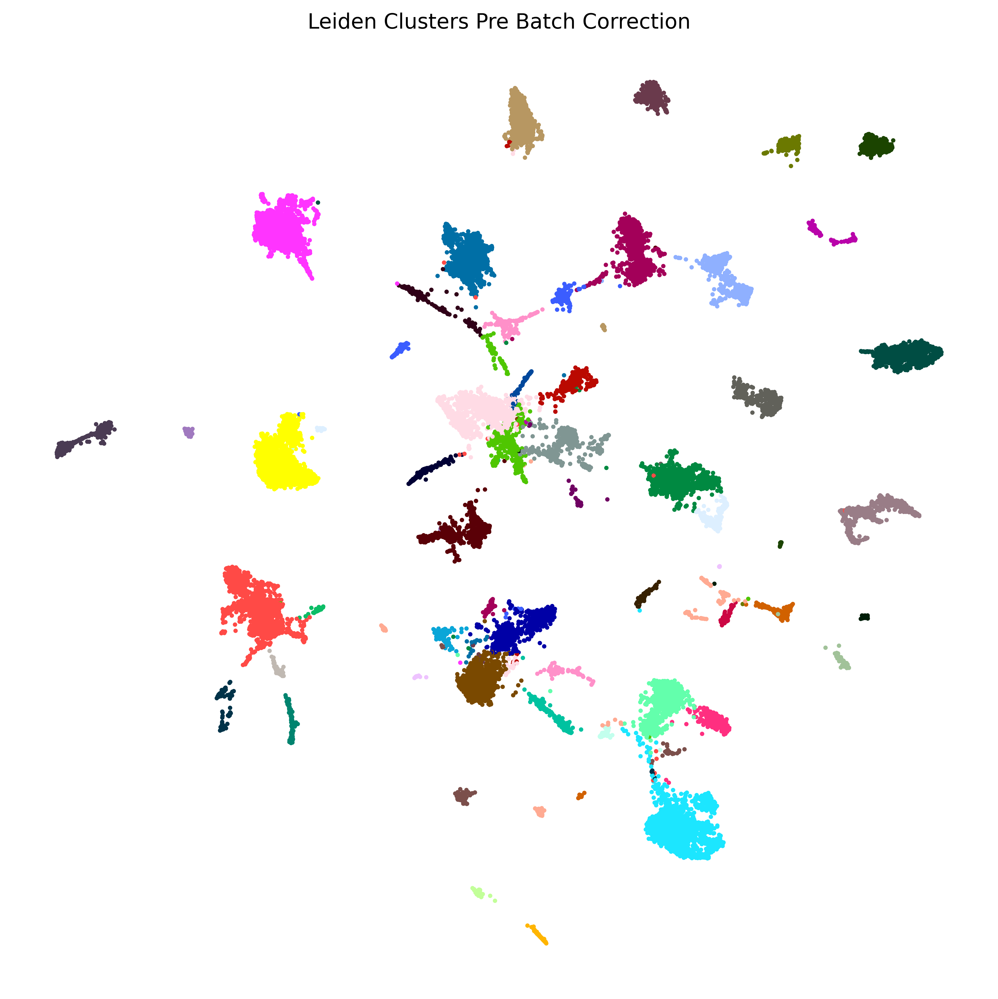

In [6]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.embedding(
        adata,
        basis='umap_noBC',
        color='leiden_preBC',
        frameon=False,
        size=DOT_SIZE,
        legend_loc=None,
        legend_fontsize=LEGEND_FONTSIZE,
        title=['Leiden Clusters Pre Batch Correction'],
        save='figure_1C_Clusters.png'
    )

# Figure 1D -- Sexes

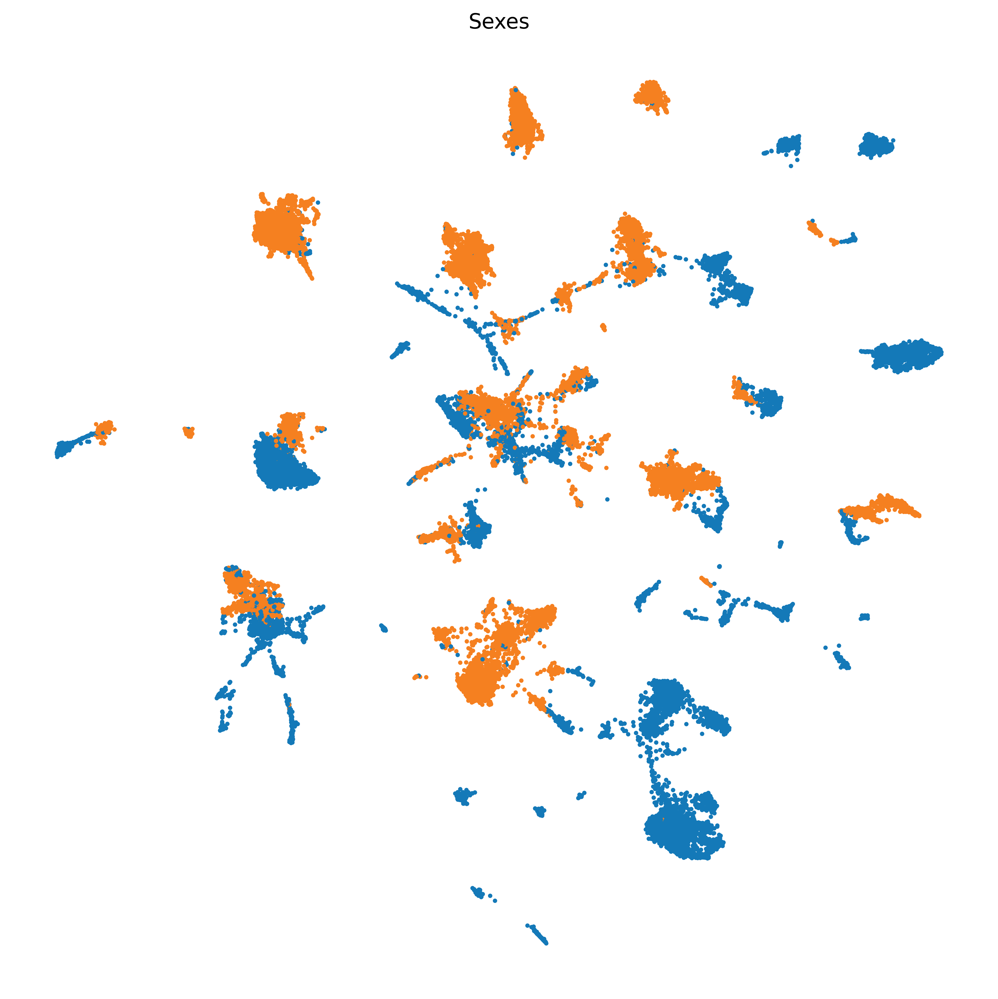

In [7]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.embedding(
        adata,
        basis='umap_noBC',
        color=['sex'],
        frameon=False,
        size=DOT_SIZE,
        title='Sexes',
        save='figure_1D_sexes.png',
        legend_loc=None
    )

# Figure 1D -- Samples

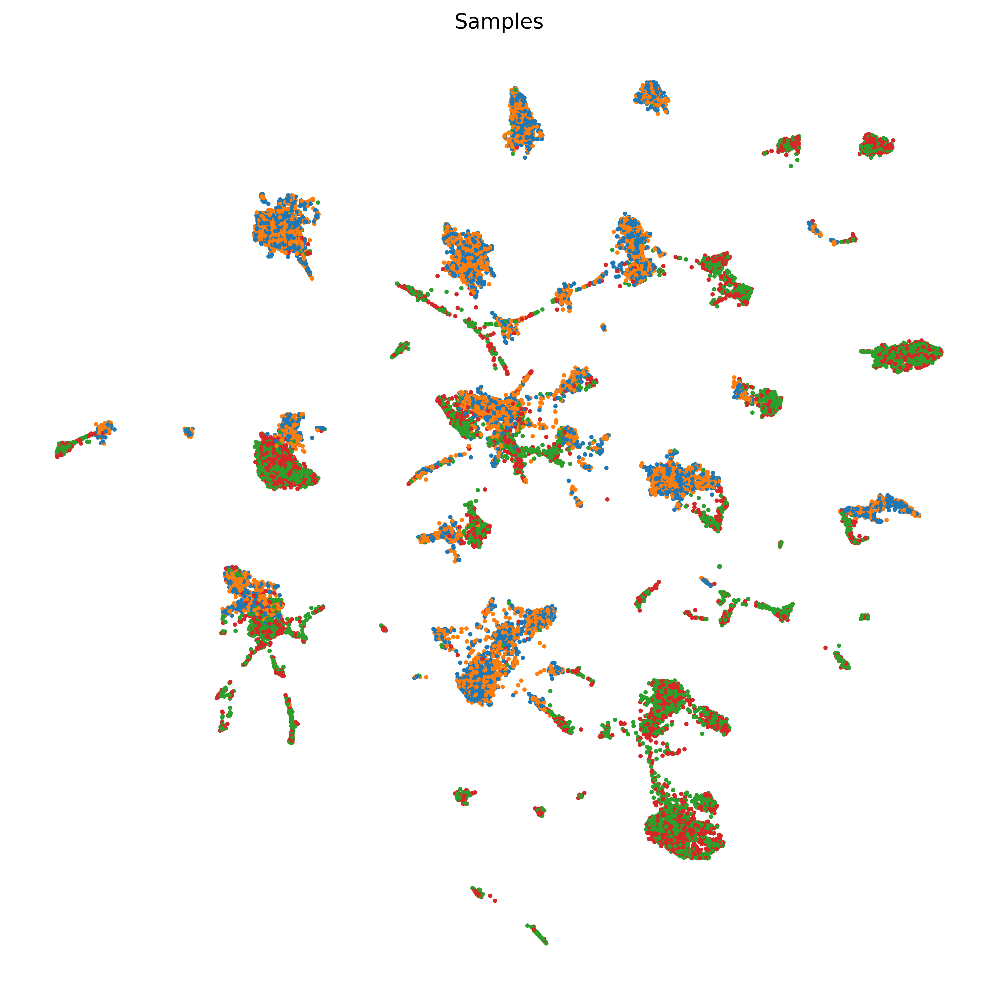

In [8]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.embedding(
        adata,
        basis='umap_noBC',
        color=['samples'],
        frameon=False,
        size=DOT_SIZE,
        title='Samples',
        save='figure_1D_samples.png',
        legend_loc=None
    )

# Figure 1X -- Sex Specificity - Pre Batch Corrected Data

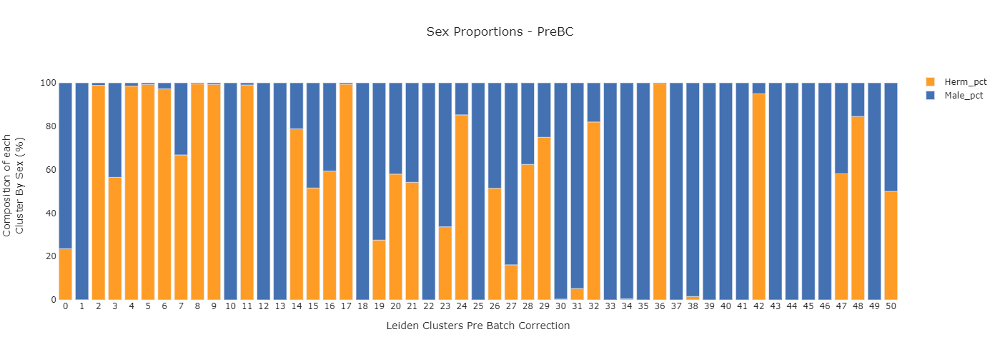

In [9]:
fig_frac_preBC = go.Figure()
bar_colors = {'Male_pct':MALE_COLOR, 'Herm_pct':HERM_COLOR}

for col in ['Herm_pct','Male_pct']:
    fig_frac_preBC.add_trace(
        go.Bar(
            x=adata.uns['sex_frac_preBC'].index,
            y=adata.uns['sex_frac_preBC'].loc[:,col] * 100,
            name=col,
            marker_color=bar_colors[col]
        )
    )
    
fig_frac_preBC.update_traces(
    opacity=0.85
)    
fig_frac_preBC.update_layout(
    barmode='relative',
    template='seaborn',
    xaxis=dict(title='Leiden Clusters Pre Batch Correction', showgrid=False),
    yaxis=dict(title='Composition of each<br>Cluster By Sex (%)', showgrid=False),
    hovermode='x unified',
    title=dict(text='Sex Proportions - PreBC'),
    width=1500,
    height=500,
    plot_bgcolor='rgba(0,0,0,0)',
)

In [12]:
adata.uns['sex_specificity_preBC_colors'] = [SHARED_SEX_COLOR, HERM_COLOR, MALE_COLOR]

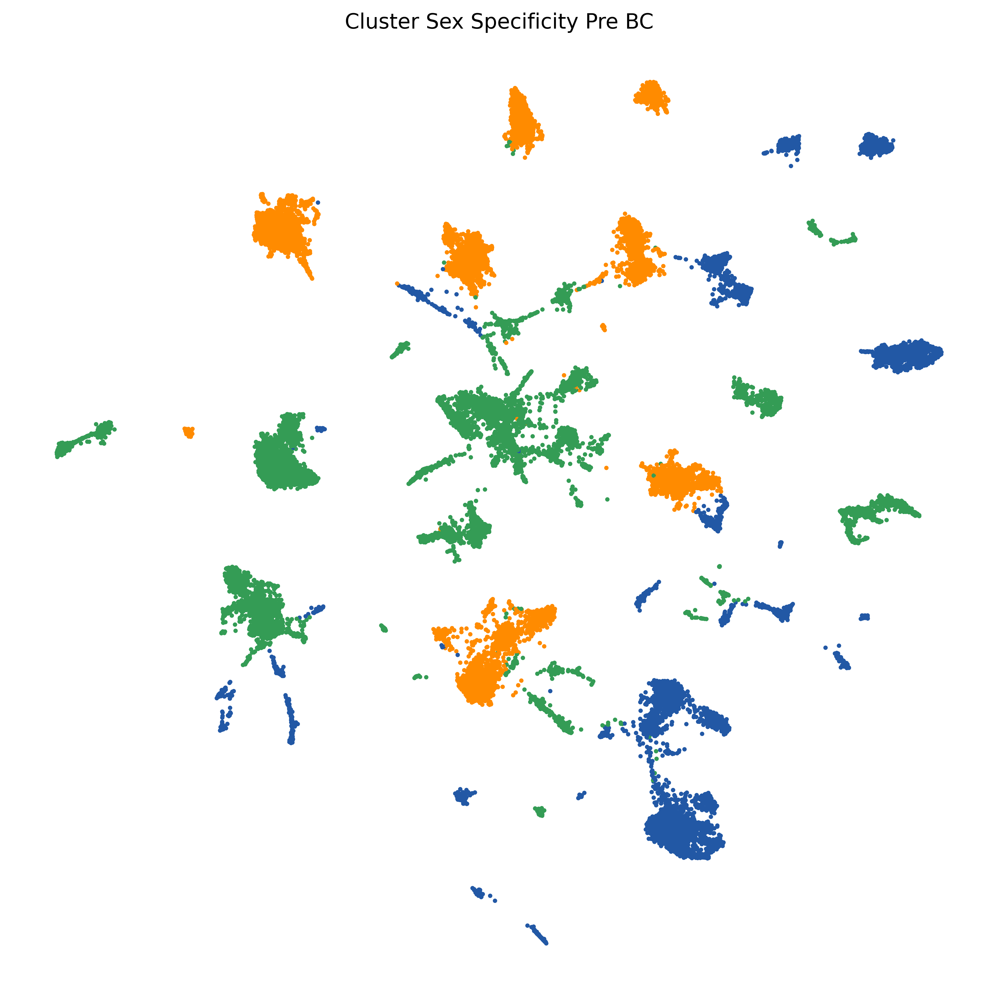

In [10]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.embedding(
        adata,
        basis='umap_noBC',
        color='sex_specificity_preBC',
        frameon=False,
        size=DOT_SIZE,
        legend_fontsize=LEGEND_FONTSIZE,
        legend_fontoutline=LEGEND_FONTOUTLINE,
        title=['Cluster Sex Specificity Pre BC'],
        save='figure_1X_SexSpecificity_PreBC.png',
        legend_loc=None
    )

# Figure 1X -- Sex Specificity - Post Batch Corrected Data

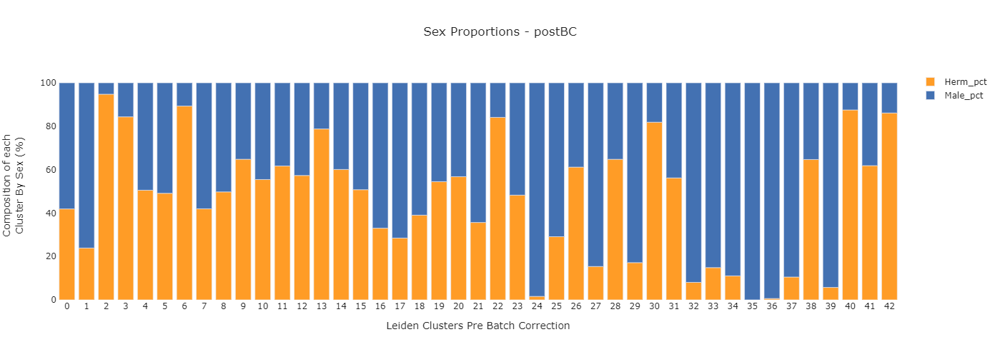

In [11]:
fig_frac_postBC = go.Figure()
bar_colors = {'Male_pct':MALE_COLOR, 'Herm_pct':HERM_COLOR}

for col in ['Herm_pct','Male_pct']:
    fig_frac_postBC.add_trace(
        go.Bar(
            x=adata.uns['sex_frac_postBC'].index,
            y=adata.uns['sex_frac_postBC'].loc[:,col] * 100,
            name=col,
            marker_color=bar_colors[col]
        )
    )
    
fig_frac_postBC.update_traces(
    opacity=0.85
)    
fig_frac_postBC.update_layout(
    barmode='relative',
    template='seaborn',
    xaxis=dict(title='Leiden Clusters Pre Batch Correction', showgrid=False),
    yaxis=dict(title='Composition of each<br>Cluster By Sex (%)', showgrid=False),
    hovermode='x unified',
    title=dict(text='Sex Proportions - postBC'),
    width=1500,
    height=500,
    plot_bgcolor='rgba(0,0,0,0)',
)

In [15]:
adata.uns['sex_specificity_postBC_colors'] = [SHARED_SEX_COLOR, HERM_COLOR, MALE_COLOR]

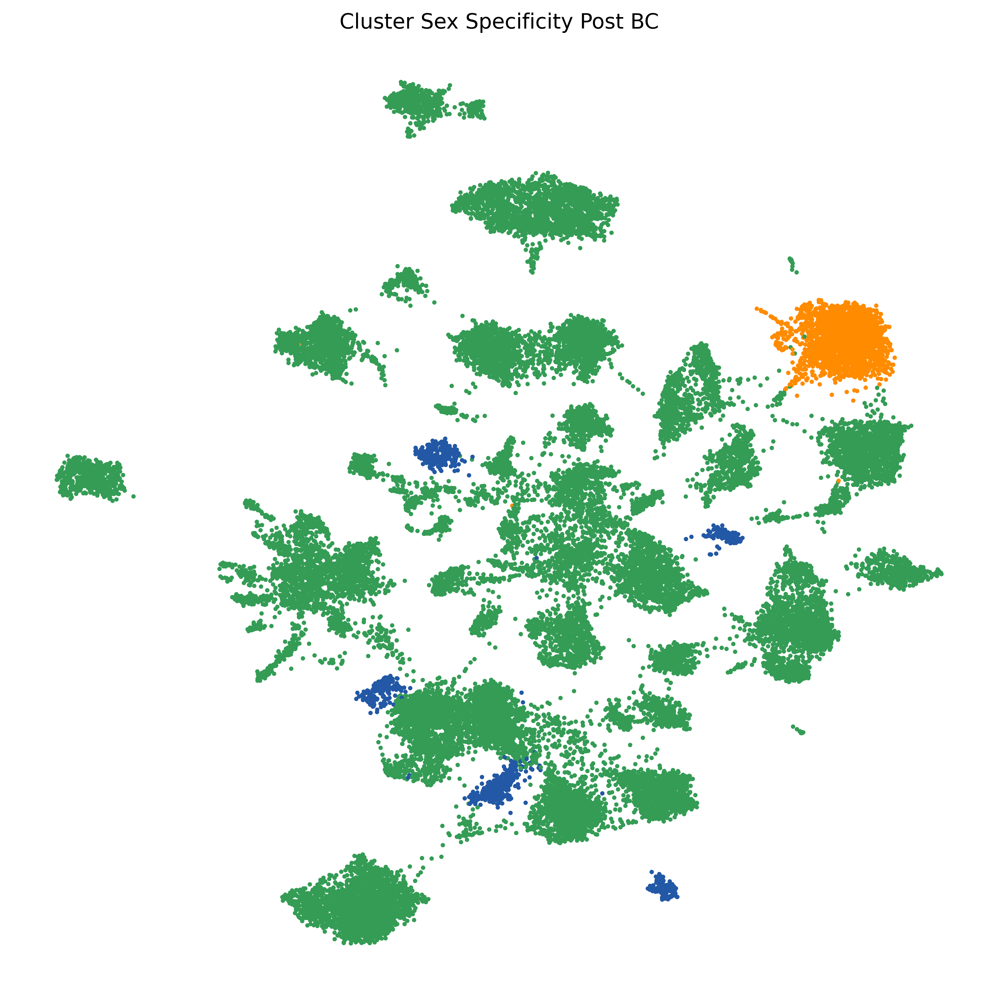

In [12]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.embedding(
        adata,
        basis='umap',
        color='sex_specificity_postBC',
        frameon=False,
        size=DOT_SIZE,
        legend_fontsize=LEGEND_FONTSIZE,
        legend_fontoutline=LEGEND_FONTOUTLINE,
        title=['Cluster Sex Specificity Post BC'],
        save='figure_1X_SexSpecificity_PostBC.png',
        legend_loc=None
    )

# Figure 1E -- Compartmets_preBC

In [13]:
# coelomocytes which are clusters 11 and 12 -- should be a different color
# adata.obs.loc[:,'Compartments_preBC'] = adata.obs.loc[:,['leiden_preBC','Compartments_preBC']].apply(lambda x: 'Coelomocyte' if x[0] in ['11','12'] else x[1],axis=1)

In [14]:
# adata.obs.loc[:,'Compartments_preBC'] = adata.obs['Compartments_preBC'].str.replace('Anatomical','Non-neural').str.replace('Neuronal','Neuron')
# adata.obs.loc[:,'Compartments_postBC'] = adata.obs['Compartments_postBC'].str.replace('Anatomical','Non-neural').str.replace('Neoronal','Neuron')

In [15]:
# COMPARTMENTS COLOR -- Non-neural, Coelomocyte, Glia, Neuron
# COMPARTMENTS_COLOR = ['#c63287','#ff99da','#693996','#fdcd0f']

In [16]:
# COMPARTMENTS_COLOR_PREBC = ['#FF7582','#6579CA','#FBC427','#FF222F']
# COMPARTMENTS_COLOR_PREBC = ["#99FFCC", "#693996", "#FFD700", "#66CCCC"]
# COMPARTMENTS_COLOR_PREBC = ["#99FFCC", "#663399", "#FFD700", "#66CCCC"]
# COMPARTMENTS_COLOR_PREBC = ['#B0FFA1','#693996','#FFCD7C','#74D19C']
# COMPARTMENTS_COLOR_PREBC = ['#DDFA9D','#40479C','#FFCD7C','#6EE67E']
COMPARTMENTS_COLOR_PREBC = ['#99E39D','#40479C','#F8C40A','#6EAA7E'] # darker



# coelomocytes, glia, neuron, anatomical
# COMPARTMENTS_COLOR_PREBC = ['#ff99da','#693996','#fdcd0f','#c63287']
# COMPARTMENTS_COLOR_POSTBC = ['#693996','#fdcd0f','#c63287']

adata.uns['Compartments_preBC_colors'] = COMPARTMENTS_COLOR_PREBC
adata.uns['Compartments_postBC_colors'] = COMPARTMENTS_COLOR_PREBC

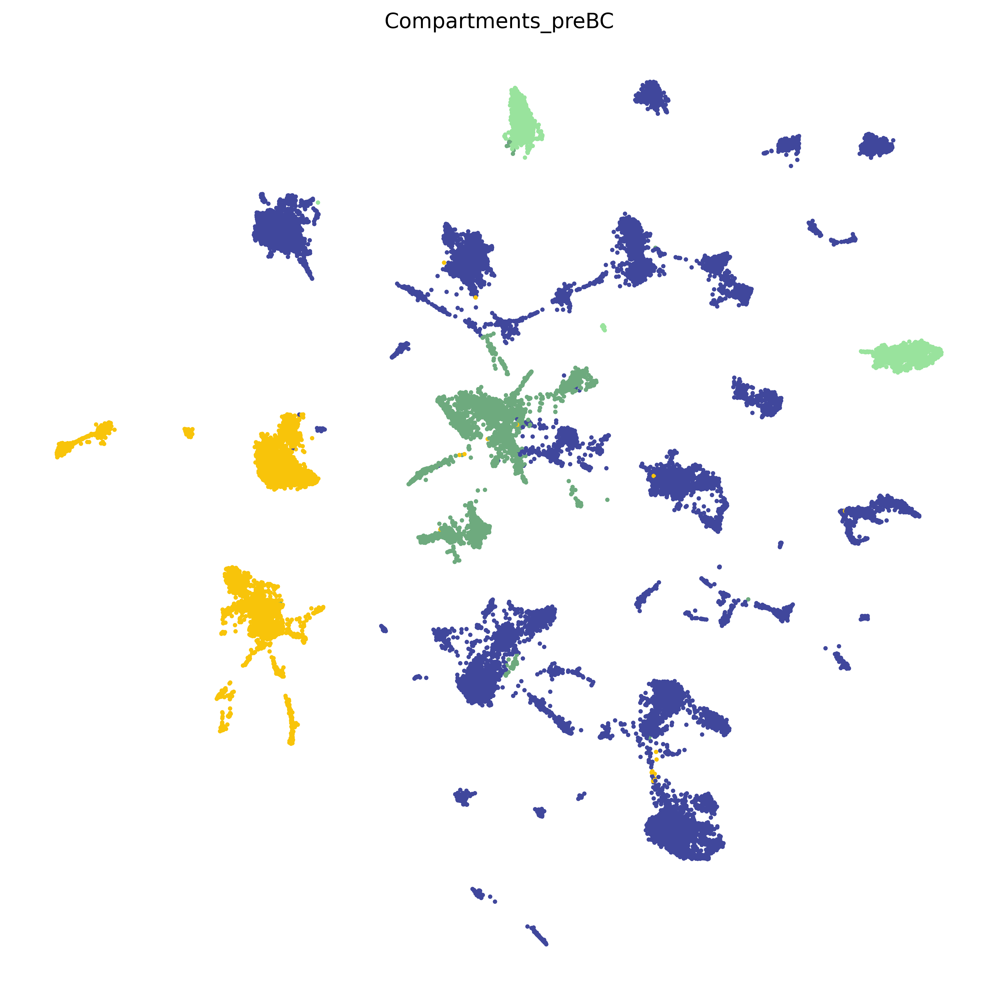

In [17]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.embedding(
        adata,
        basis='umap_noBC',
        color=['Compartments_preBC'],
        frameon=False,
        size=DOT_SIZE,
        save='figure_1E_Compartments_PreBC.png',
        legend_loc=None
    )

# Figure 1E -- Compartmets_postBC

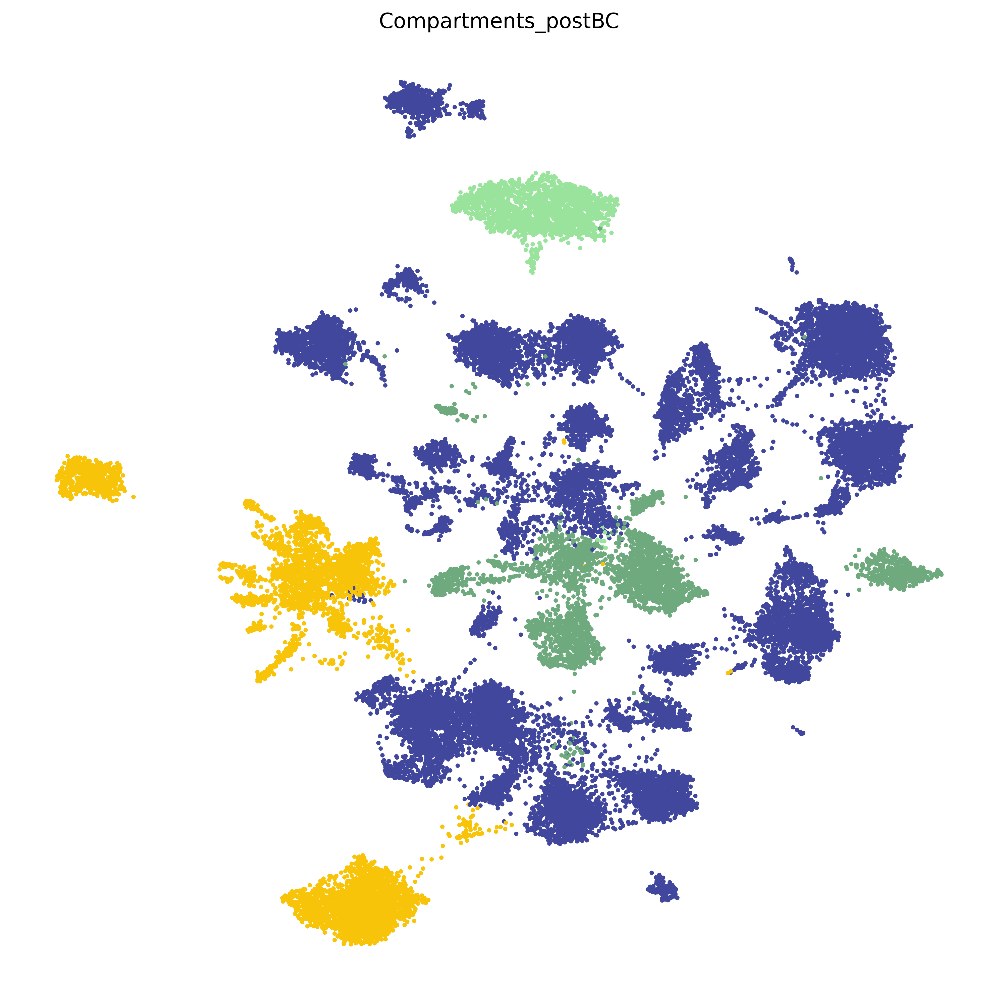

In [18]:
with matplotlib.pyplot.rc_context({'figure.figsize':UMAP_FIGSIZE}):
    sc.pl.umap(
        adata,
        color=['Compartments_postBC'],
        frameon=False,
        size=DOT_SIZE,
        save='figure_1E_Compartments_PostBC.png',
        legend_loc=None
    )